### Air Quality Exploratory Data Analysis

Data from Kaggle's Air Quality Monitoring in European Cities data set ([available here](https://www.kaggle.com/datasets/yekenot/air-quality-monitoring-in-european-cities/data)).

In [1]:
# import useful packages

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

/var/folders/_k/134f7vnj7vz80rspwnrwcnj00000gn/T/ipykernel_11322/2276229895.py:3: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


Let's start by loading the `ancona_data.csv` file and take a look at what it containts

In [2]:
ancona = pd.read_csv('../archive/ancona_data.csv')

# print the first 5 rows of the dataframe
ancona.head()

,Date,NO2,O3,PM10,PM2.5,Latitude,Longitude,station_name,Wind-Speed (U),Wind-Speed (V),Dewpoint Temp,Soil Temp,Total Percipitation,Vegitation (High),Vegitation (Low),Temp,Relative Humidity,code,id
0,2021-09-01 01:00:00,7.000000,53.000000,15.000000,4.000000,43.612386,13.510830,Ancona Citadella,-0.528286,-0.987673,63.563788,66.476667,0.0,3.184390,2.847654,66.075624,85.422435,IT1827A,26
1,2021-09-01 01:00:00,8.000000,NaN,9.000000,NaN,43.527982,13.246672,Jesi,-0.529657,-0.987282,64.894507,67.803820,0.0,3.179204,2.851910,67.392994,85.502078,IT0460A,23
2,2021-09-01 01:00:00,9.035176,49.232338,10.681684,7.700312,43.450000,13.250000,Ancona CAMS Station 11,-0.529798,-0.987225,65.123477,68.032686,0.0,3.176792,2.852830,67.622493,85.500013,ANCCAMS11,39
3,2021-09-01 01:00:00,10.292098,51.336113,10.310384,6.732396,43.550000,13.450000,Ancona CAMS Station 8,-0.528619,-0.987565,63.943511,66.855648,0.0,3.181947,2.849007,66.453195,85.435906,ANCCAMS08,36
4,2021-09-01 01:00:00,8.348963,39.351303,10.273862,7.066792,43.550000,13.150000,Ancona CAMS Station 5,-0.530069,-0.987179,65.208544,68.116622,0.0,3.179280,2.852743,67.701531,85.534001,ANCCAMS05,33


According to the Kaggle page `PM10` is the atmospheric aerosols concentration with a maximum particle diameter of 10 micrometers (μg/m3). If we're interested in learning about pollution in the air this is a pretty good parameter to start with as it's these small particles that can get into our lungs and cause damage when we breathe them in.

Let's look at this parameter a bit more closely.

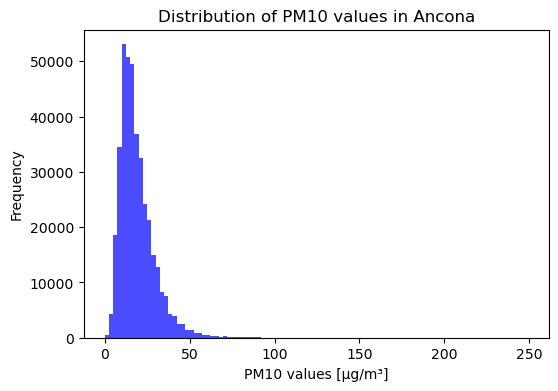

In [3]:
# Plot the distribution of the PM10 values

plt.figure(figsize=(6, 4))
plt.hist(ancona['PM10'], bins=100, color='blue', alpha=0.7)
plt.title('Distribution of PM10 values in Ancona')
plt.xlabel('PM10 values [µg/m³]')
plt.ylabel('Frequency')
plt.show()

I know the data set is focused on Ancona but I'm curious about exactly where this data is coming from so let's go ahead and plot the longitudes and latitudes to get an idea of how this data works.

In [5]:
import plotly.express as px

fig = px.scatter_mapbox(ancona, 
                        lat="Latitude", 
                        lon="Longitude", 
                        zoom=8, 
                        height=400,
                        width=400)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Okay this is interesting, we have a few more data points around the center of the city but outside of that we have some nice coverage of the city. That being said the data is still pretty localized so it might be hard to make regional comparisons.

My next question focuses on the time scale of this data. Let's use pandas to plot the variation of the `PM10` parameter over time.

In [10]:
# Convert the date column to datetime format
ancona['Date'] = pd.to_datetime(ancona['Date'])

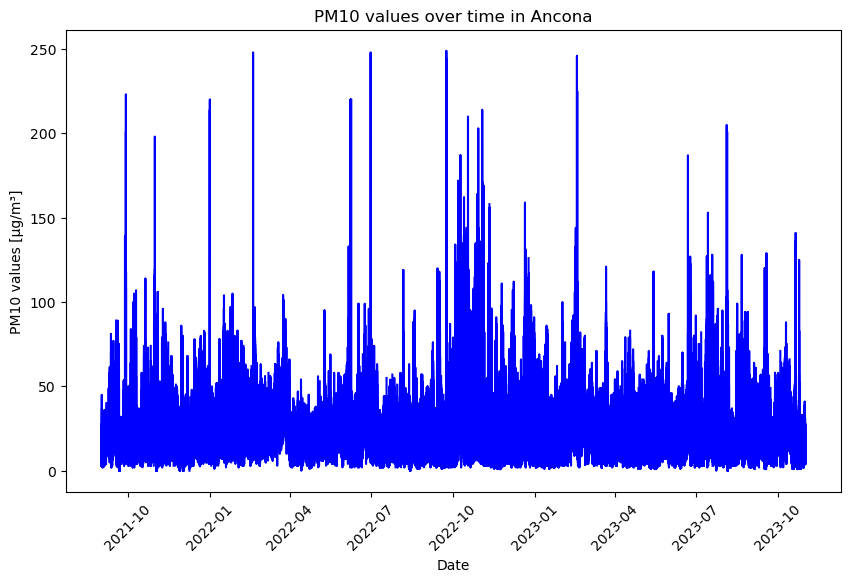

In [12]:
# Plot PM10 over time
plt.figure(figsize=(10, 6))
plt.plot(ancona['Date'], ancona['PM10'], color='blue')
plt.title('PM10 values over time in Ancona')
plt.xlabel('Date')
plt.ylabel('PM10 values [µg/m³]')
plt.xticks(rotation=45)
plt.show()

We some variation here but it's not actually that easy to parse in part due to the density of data. Let's try plotting this with a 2 week smoothing window in order to get a better idea of the trends.

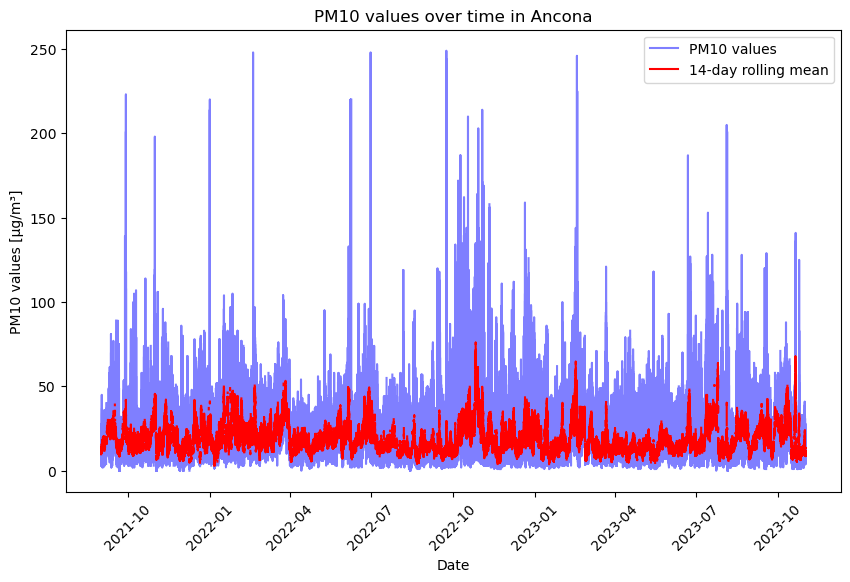

In [14]:
# Plot PM10 over time with a 14-day rolling mean
plt.figure(figsize=(10, 6))
plt.plot(ancona['Date'], ancona['PM10'], color='blue', alpha=0.5, label='PM10 values')
plt.plot(ancona['Date'], ancona['PM10'].rolling(window=14).mean(), color='red', label='14-day rolling mean')
plt.title('PM10 values over time in Ancona')
plt.xlabel('Date')
plt.ylabel('PM10 values [µg/m³]')
plt.xticks(rotation=45)
plt.legend()
plt.show()

What we see now is a relatively flat trend with a few peaks in places. Let's try folding this data so we get the values as a function of month. This might give us insight into seasonal variations.

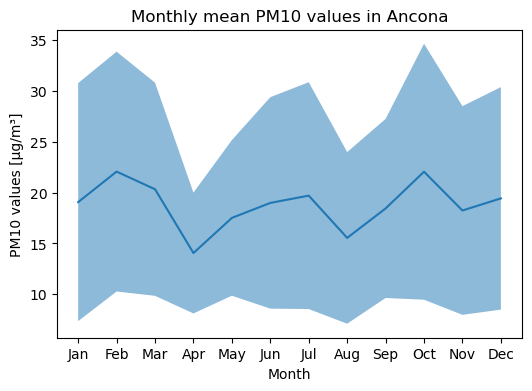

In [19]:
# Fold data to get PM10 as a function of month

ancona['Month'] = ancona['Date'].dt.month
monthly_mean = ancona.groupby('Month')['PM10'].mean()
monthly_std = ancona.groupby('Month')['PM10'].std()

plt.figure(figsize=(6, 4))
plt.fill_between(monthly_mean.index, monthly_mean.values - monthly_std, 
                 monthly_mean.values + monthly_std,alpha = 0.5)
plt.plot(monthly_mean, color='C0')
plt.title('Monthly mean PM10 values in Ancona')
plt.xlabel('Month')
plt.ylabel('PM10 values [µg/m³]')
plt.xticks(np.arange(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

We now have the average monthly temperature as well as a quick sense of the error on this temperature given by the standard deviation around the mean. From this it looks like there aren't any significant differences across months. This is actually pretty interesting as I would have thought there could be monthly differences. 

Now that we've taken a look at the data in a bit of detail we can move to detecting times with particularly high pollution. This will be done in an analysis notebook.